# Pulmonary Localization Using Convolutional Neural Networks - Xception Architecture
***

### 1. Importing and Installing Packages
***

In [ ]:
!pip install lungs-segmentation

In [ ]:
from lungs_segmentation.pre_trained_models import create_model
from sklearn.model_selection import train_test_split
import lungs_segmentation.inference as inference
from bbox_delimiters import bbox_utils
import matplotlib.pyplot as plt
from google.colab import drive 
import urllib.request as url
import tensorflow as tf
import pandas as pd
import numpy as np
import shutil
import random
import glob
import time
import cv2
import torch

In [ ]:
seg_model = bbox_utils().model_segmentation(architecture = 'resnet34')

### 2. Importing CheXpert Data
***

In [ ]:
drive.mount('/content/gdrive', force_remount = True)
!cp -r /content/gdrive/MyDrive/chexpert-v10-small.zip /content/
!unzip /content/chexpert-v10-small.zip
!rm /content/chexpert-v10-small.zip

### 3. Creating Training, Validation, and Testing Dataframes
***

In [ ]:
train_data = pd.read_csv('/content/train-data.csv', delimiter = ',',
                         usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
test_data = pd.read_csv('/content/test-data.csv', delimiter = ',',
                        usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])
val_data = pd.read_csv('/content/val-data.csv', delimiter = ',',
                       usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

print('Training Images: {} images'.format(len(train_data)))
print('Validation Images: {} images'.format(len(val_data)))
print('Test Images: {} images'.format(len(test_data)))

Training Images: 152808 images
Validation Images: 19051 images
Test Images: 19101 images


### 4. Preparing Data for the Network
***

In [ ]:
def make_gen(dataframe):
  '''
  build an image generator from a dataframe

  Args:
    dataframe (dataframe) --> pandas pack data set

  Returns:
    gen (generator) --> keras data generator
  '''

  data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)
  gen = data_gen.flow_from_dataframe(dataframe = dataframe, directory = '', x_col = 'Path',
                                     y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                     target_size = (128, 128), color_mode ='rgb', batch_size = 128,
                                     class_mode='raw', shuffle = True, seed = 42)
  
  return gen

In [ ]:
train_generator = make_gen(dataframe = train_data)
validation_generator = make_gen(dataframe = val_data)
test_generator = make_gen(dataframe = test_data)

Found 152808 validated image filenames.
Found 19051 validated image filenames.
Found 19101 validated image filenames.


### 5. Organizing the Network Architecture
***

In [ ]:
conv_base = tf.keras.applications.Xception(input_shape = (128, 128,3), include_top = False, weights = 'imagenet')

In [98]:
layers_name = list()
for layer in conv_base.layers:
  layers_name.append(layer.name)

block_names = ['input_4', 'block4_sepconv1_act', 'block6_sepconv3_act', 'block9_sepconv1_bn', 'block11_sepconv3_bn']

for blocks in block_names:
  try:
    layers_name.index(blocks)
    print('Bloco ' + blocks + ' found!')
  except ValueError:
    print('Bloco ' + blocks + ' not found!')

Bloco input_4 found!
Bloco block4_sepconv1_act found!
Bloco block6_sepconv3_act found!
Bloco block9_sepconv1_bn found!
Bloco block11_sepconv3_bn found!


In [99]:
inputs = tf.keras.Input(shape=(128, 128, 3))
feature_extractor = conv_base(inputs)

x = tf.keras.layers.GlobalAveragePooling2D()(feature_extractor)
x = tf.keras.layers.Flatten()(x)
x = tf.keras.layers.Dense(units = 512, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 256, activation = tf.nn.relu)(x)
x = tf.keras.layers.Dense(units = 64, activation = tf.nn.relu)(x)

bounding_box_regression_output = tf.keras.layers.Dense(units = 4)(x)
model = tf.keras.models.Model(inputs = inputs, outputs = bounding_box_regression_output)

model.compile(optimizer=tf.keras.optimizers.SGD(momentum = 0.9), loss = 'mean_squared_error', metrics = ['acc'])

In [100]:
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [101]:
def freeze_layers(conv_base, layer_name):
  '''
  freeze layers of convolutional neural network training

  Args:
    conv_base (tensor) --> convolutional layers of the model
    layer_name (str) --> name of the freezing weight boundary layer
  '''

  conv_base.trainable = True
  set_trainable = False

  for layer in conv_base.layers:
    if layer.name == layer_name:
      set_trainable = True
    if set_trainable:
      layer.trainable = True
    else:
      layer.trainable = False
  
  return None

### 5. Organizing the Assessment Metric (IoU)
***

In [ ]:
def intersection_over_union(pred_box, true_box, smoothing_factor = 1e-10):
  '''
  intersection metric on the Union of bounding boxes

  Args:
    pred_box (list) --> coordinates of predicted bounding boxes
    true_box (list) --> coordinates of the original bounding boxes

  Returns:
    iou (int) --> calculated IoU metric
  '''

  xmin_pred, ymin_pred, xmax_pred, ymax_pred =  pred_box
  xmin_true, ymin_true, xmax_true, ymax_true = true_box

  xmin_overlap = np.maximum(xmin_pred, xmin_true)
  xmax_overlap = np.minimum(xmax_pred, xmax_true)
  ymin_overlap = np.maximum(ymin_pred, ymin_true)
  ymax_overlap = np.minimum(ymax_pred, ymax_true)

  pred_box_area = (xmax_pred - xmin_pred) * (ymax_pred - ymin_pred)
  true_box_area = (xmax_true - xmin_true) * (ymax_true - ymin_true)

  overlap_area = np.maximum((xmax_overlap - xmin_overlap), 0)  * np.maximum((ymax_overlap - ymin_overlap), 0)
  union_area = (pred_box_area + true_box_area) - overlap_area
    
  iou = (overlap_area + smoothing_factor) / (union_area + smoothing_factor)

  return iou

### 6. Getting Test Data
***

In [ ]:
for i in range(0, len(test_generator)):
  x, y = test_generator[i]
  if i == 0:
    test_images, test_labels = x, y
  else:
    test_images, test_labels = np.concatenate((test_images, x)), np.concatenate((test_labels, y))

### 7. Model Training
***

In [102]:
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath = 'weights.hdf5', monitor = 'val_acc', verbose = True, 
                                                save_best_only = True, save_weights_only = True, mode = 'max')
callbacks = [checkpoint]

In [103]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[4])
 model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [104]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 942s 777ms/step - loss: 0.0067 - acc: 0.6767 - val_loss: 0.0037 - val_acc: 0.7203

Epoch 00001: val_acc improved from -inf to 0.72033, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 941s 786ms/step - loss: 0.0033 - acc: 0.7512 - val_loss: 0.0029 - val_acc: 0.7646

Epoch 00002: val_acc improved from 0.72033 to 0.76458, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 931s 777ms/step - loss: 0.0027 - acc: 0.7826 - val_loss: 0.0025 - val_acc: 0.7900

Epoch 00003: val_acc improved from 0.76458 to 0.78998, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 929s 776ms/step - loss: 0.0024 - acc: 0.8001 - val_loss: 0.0023 - val_acc: 0.7996

Epoch 00004: val_acc improved from 0.78998 to 0.79959, saving model to weights.hdf5


In [ ]:
model.save('model_xception1')
!zip -r model_xception1.zip /content/model_xception1
shutil.move('/content/model_xception1.zip', '/content/gdrive/MyDrive/lung-localization/xception/')

In [108]:
iou_mean_list = list()
iou_scores_list = list()
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('IoU Metric: {:.2f}%'.format(iou_mean_list[0] * 100))

IoU Metric: 82.93%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model1_xception.txt', scores)
shutil.move('/content/scores_model1_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

In [110]:
 freeze_layers(conv_base = conv_base, layer_name = block_names[3])
 model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [111]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 937s 781ms/step - loss: 0.0022 - acc: 0.8118 - val_loss: 0.0021 - val_acc: 0.8094

Epoch 00001: val_acc improved from 0.79959 to 0.80935, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 942s 786ms/step - loss: 0.0020 - acc: 0.8166 - val_loss: 0.0020 - val_acc: 0.8161

Epoch 00002: val_acc improved from 0.80935 to 0.81613, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 941s 785ms/step - loss: 0.0019 - acc: 0.8253 - val_loss: 0.0019 - val_acc: 0.8232

Epoch 00003: val_acc improved from 0.81613 to 0.82316, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 944s 788ms/step - loss: 0.0018 - acc: 0.8312 - val_loss: 0.0018 - val_acc: 0.8296

Epoch 00004: val_acc improved from 0.82316 to 0.82962, saving model to weights.hdf5


In [ ]:
model.save('model_xception2')
!zip -r model_xception2.zip /content/model_xception2
shutil.move('/content/model_xception2.zip', '/content/gdrive/MyDrive/lung-localization/xception/')

In [113]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[1] * 100))

Métrica IoU: 85.11%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model2_xception.txt', scores)
shutil.move('/content/scores_model2_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

In [115]:
freeze_layers(conv_base = conv_base, layer_name = block_names[2])
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [116]:
  history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 943s 787ms/step - loss: 0.0018 - acc: 0.8352 - val_loss: 0.0017 - val_acc: 0.8344

Epoch 00001: val_acc improved from 0.82962 to 0.83444, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 945s 787ms/step - loss: 0.0017 - acc: 0.8386 - val_loss: 0.0017 - val_acc: 0.8383

Epoch 00002: val_acc improved from 0.83444 to 0.83828, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 942s 786ms/step - loss: 0.0016 - acc: 0.8419 - val_loss: 0.0016 - val_acc: 0.8407

Epoch 00003: val_acc improved from 0.83828 to 0.84069, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 943s 786ms/step - loss: 0.0016 - acc: 0.8446 - val_loss: 0.0016 - val_acc: 0.8381

Epoch 00004: val_acc did not improve from 0.84069


In [ ]:
model.save('model_xception3')
!zip -r model_xception3.zip /content/model_xception3
shutil.move('/content/model_xception3.zip', '/content/gdrive/MyDrive/lung-localization/xception/')

In [124]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[2] * 100))

Métrica IoU: 86.04%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model3_xception.txt', scores) 
shutil.move('/content/scores_model3_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

In [120]:
freeze_layers(conv_base = conv_base, layer_name = block_names[1])
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [131]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 939s 783ms/step - loss: 0.0016 - acc: 0.8483 - val_loss: 0.0016 - val_acc: 0.8463

Epoch 00001: val_acc improved from 0.84069 to 0.84625, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 945s 788ms/step - loss: 0.0015 - acc: 0.8503 - val_loss: 0.0015 - val_acc: 0.8477

Epoch 00002: val_acc improved from 0.84625 to 0.84772, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 945s 788ms/step - loss: 0.0015 - acc: 0.8514 - val_loss: 0.0015 - val_acc: 0.8498

Epoch 00003: val_acc improved from 0.84772 to 0.84982, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 946s 788ms/step - loss: 0.0015 - acc: 0.8550 - val_loss: 0.0015 - val_acc: 0.8506

Epoch 00004: val_acc improved from 0.84982 to 0.85061, saving model to weights.hdf5


In [ ]:
model.save('model_xception4')
!zip -r model_xception4.zip /content/model_xception4
shutil.move('/content/model_xception4.zip', '/content/gdrive/MyDrive/lung-localization/xception/')

In [133]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[3] * 100))

Métrica IoU: 86.86%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model4_xception.txt', scores)
shutil.move('/content/scores_model4_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

In [135]:
freeze_layers(conv_base = conv_base, layer_name = block_names[0])
model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
xception (Functional)        (None, 4, 4, 2048)        20861480  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 512)               1049088   
_________________________________________________________________
dense_5 (Dense)              (None, 256)               131328    
_________________________________________________________________
dense_6 (Dense)              (None, 64)                1644

In [136]:
history = model.fit(train_generator, validation_data = validation_generator, 
                    epochs = 4, verbose = True, use_multiprocessing = True,
                    workers = 8, callbacks = callbacks)

Epoch 1/4
1194/1194 [==============================] - 954s 796ms/step - loss: 0.0014 - acc: 0.8570 - val_loss: 0.0014 - val_acc: 0.8540

Epoch 00001: val_acc improved from 0.85061 to 0.85397, saving model to weights.hdf5
Epoch 2/4
1194/1194 [==============================] - 953s 794ms/step - loss: 0.0014 - acc: 0.8585 - val_loss: 0.0014 - val_acc: 0.8547

Epoch 00002: val_acc improved from 0.85397 to 0.85471, saving model to weights.hdf5
Epoch 3/4
1194/1194 [==============================] - 945s 788ms/step - loss: 0.0014 - acc: 0.8599 - val_loss: 0.0014 - val_acc: 0.8551

Epoch 00003: val_acc improved from 0.85471 to 0.85513, saving model to weights.hdf5
Epoch 4/4
1194/1194 [==============================] - 986s 822ms/step - loss: 0.0014 - acc: 0.8615 - val_loss: 0.0014 - val_acc: 0.8589

Epoch 00004: val_acc improved from 0.85513 to 0.85885, saving model to weights.hdf5


In [ ]:
model.save('model_xception5')
!zip -r model_xception5.zip /content/model_xception5
shutil.move('/content/model_xception5.zip', '/content/gdrive/MyDrive/lung-localization/xception/')

In [138]:
pred_boxes = model.predict(test_images)

scores = list()
for j in range(0, len(pred_boxes)):
  scores.append(intersection_over_union(pred_boxes[j], test_labels[j]))
    
iou_mean_list.append(np.array(scores).mean())
iou_scores_list.append(scores)

print('Métrica IoU: {:.2f}%'.format(iou_mean_list[4] * 100))

Métrica IoU: 87.39%


In [ ]:
scores = np.array(scores)
np.savetxt('scores_model5_xception.txt', scores)
shutil.move('/content/scores_model5_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

In [ ]:
np.savetxt('iou_mean_xception.txt', np.array(iou_mean_list), fmt = '%s')
shutil.move('/content/iou_mean_xception.txt', '/content/gdrive/MyDrive/lung-localization/xception/')

## 8. Results View
***

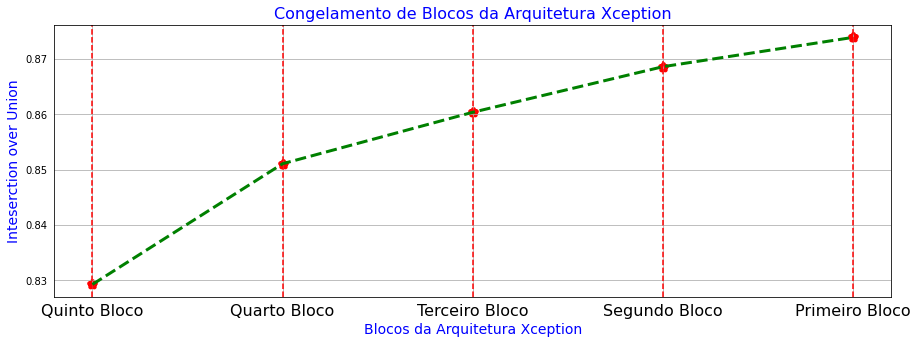

In [141]:
plt.figure(figsize = (15, 5))
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.scatter(x_labels, np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')
for line in range(0, 5):
  plt.axvline(line, color = 'red', linestyle = '--')
plt.plot(x_labels, np.array(iou_mean_list), linestyle = '--', color = 'green', linewidth = 3)
plt.xticks(size = 16, color = 'black')
plt.yticks(color = 'black')
plt.title('Congelamento de Blocos da Arquitetura Xception', size = 16, color = 'blue')
plt.xlabel('Blocos da Arquitetura Xception', size = 14, color = 'blue')
plt.ylabel('Inteserction over Union', size = 14, color = 'blue')
plt.grid(True)

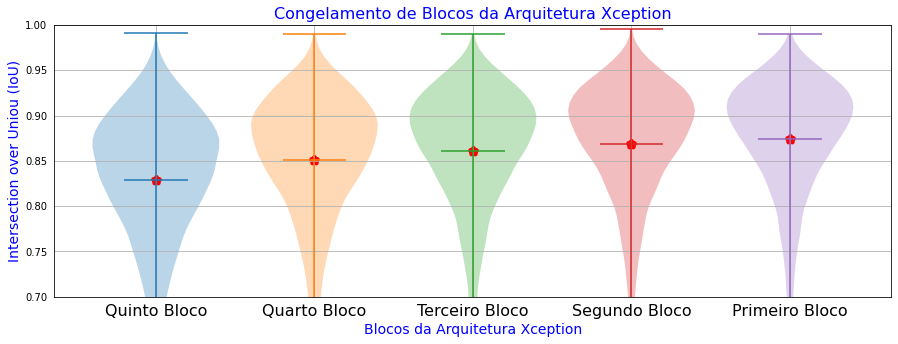

In [142]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura Xception', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura Xception', size = 16, color = 'blue')
plt.scatter([1, 2, 3, 4, 5], np.array(iou_mean_list), marker = '*', linewidths = 5, color = 'red')

Text(0.5, 1.0, 'Congelamento de Blocos da Arquitetura Xception')

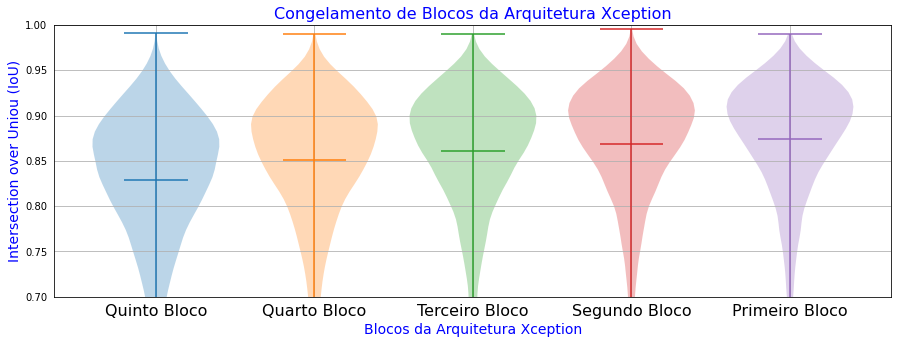

In [143]:
plt.figure(figsize = (15, 5))
plt.violinplot(iou_scores_list[0], positions = [1], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[1], positions = [2], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[2], positions = [3], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[3], positions = [4], showmeans = True, widths = 0.8)
plt.violinplot(iou_scores_list[4], positions = [5], showmeans = True, widths = 0.8)
plt.ylim([0.70, 1.0])
x_labels = ['Quinto Bloco', 'Quarto Bloco', 'Terceiro Bloco', 'Segundo Bloco', 'Primeiro Bloco']
plt.xticks(ticks = [1, 2, 3, 4, 5], labels = x_labels, size = 16, color = 'black')
plt.yticks(color = 'black')
plt.grid(True)
plt.xlabel('Blocos da Arquitetura Xception', size = 14, color = 'blue')
plt.ylabel('Intersection over Uniou (IoU)', size = 14, color = 'blue')
plt.title('Congelamento de Blocos da Arquitetura Xception', size = 16, color = 'blue')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

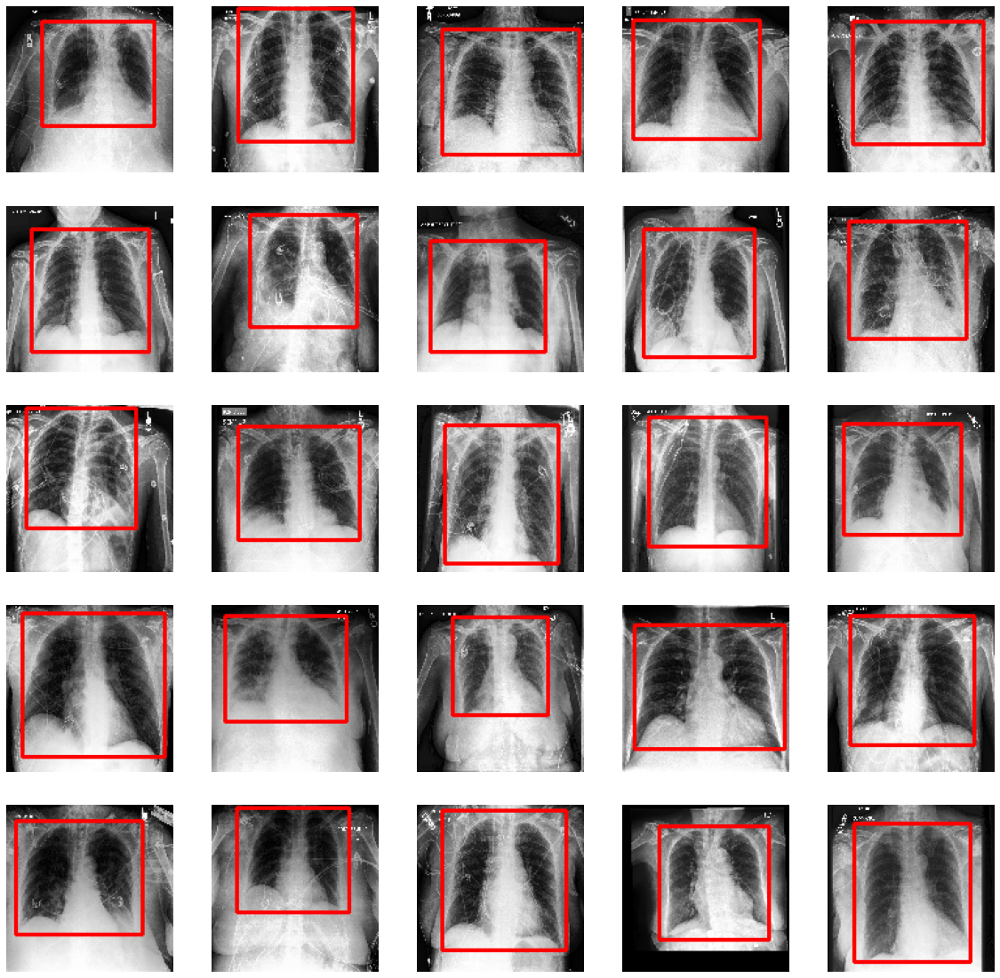

In [144]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

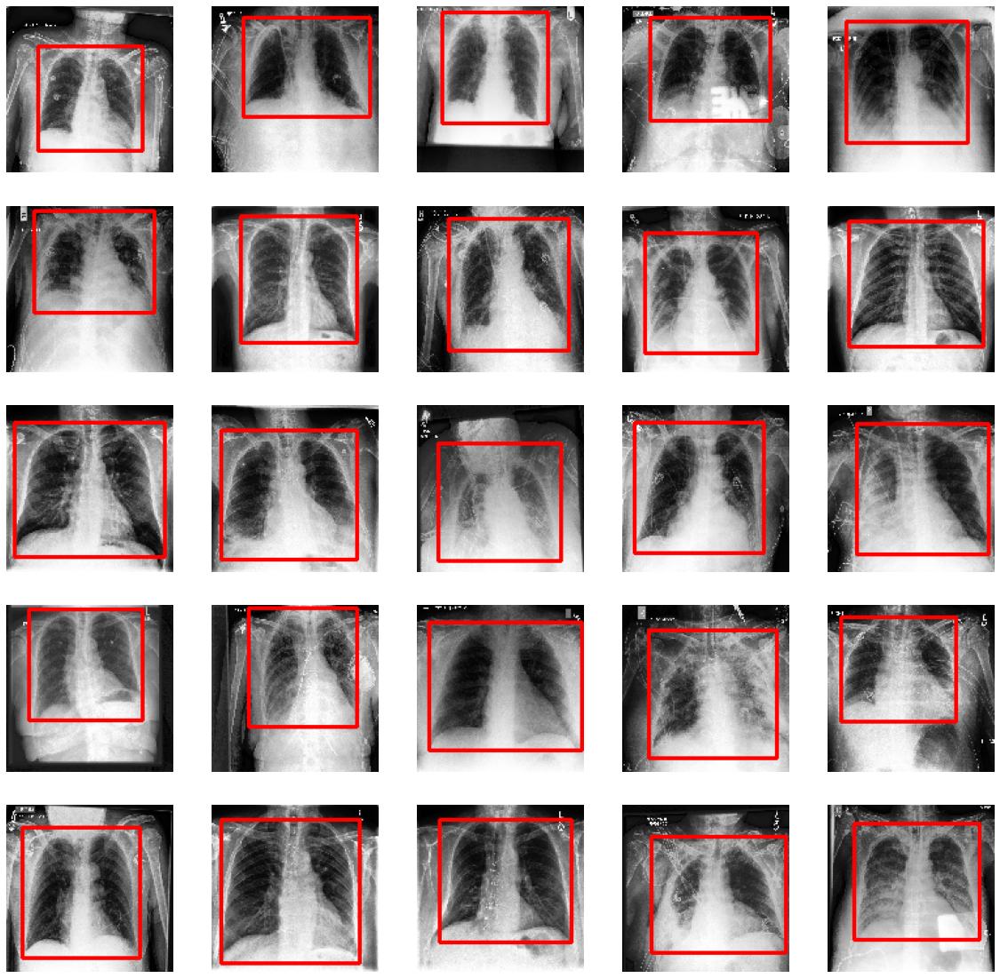

In [145]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

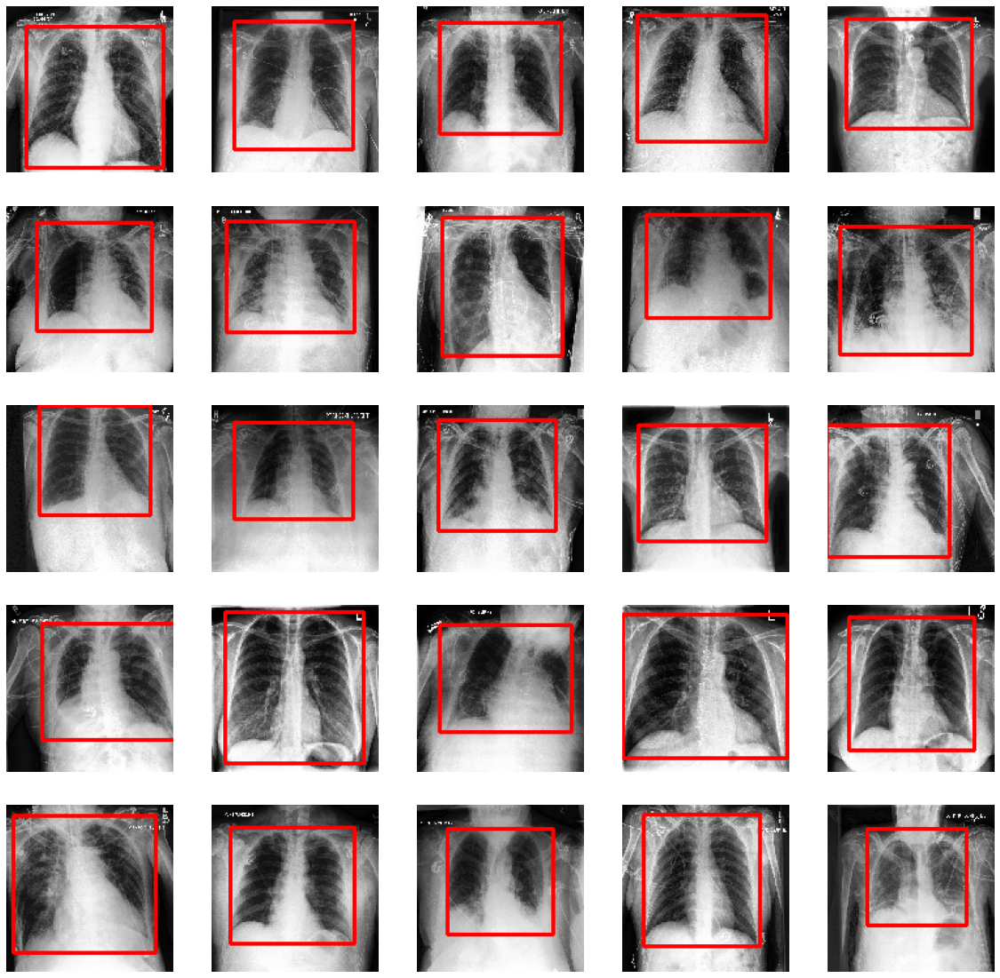

In [146]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(test_images))
    coordinates = model.predict(np.reshape(test_images[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(image = test_images[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')

## 9. Comparison of Methods
***

In [147]:
plot_df = pd.read_csv('/content/plot-data-chexpert.csv', delimiter = ',', 
                      usecols = ['Path', 'p1_x', 'p1_y', 'p2_x', 'p2_y'])

data_gen = tf.keras.preprocessing.image.ImageDataGenerator(rescale = 1./255.)

plot_generator = data_gen.flow_from_dataframe(dataframe = plot_df, directory = '', x_col = 'Path',
                                              y_col = ['p1_x', 'p1_y', 'p2_x', 'p2_y'], 
                                              target_size = (128, 128), color_mode = 'rgb', batch_size = 50,
                                              class_mode = 'raw', shuffle = False, seed = 42)

plot_x, plot_y = plot_generator[0]
plot_files = list(plot_df['Path'])

Found 50 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

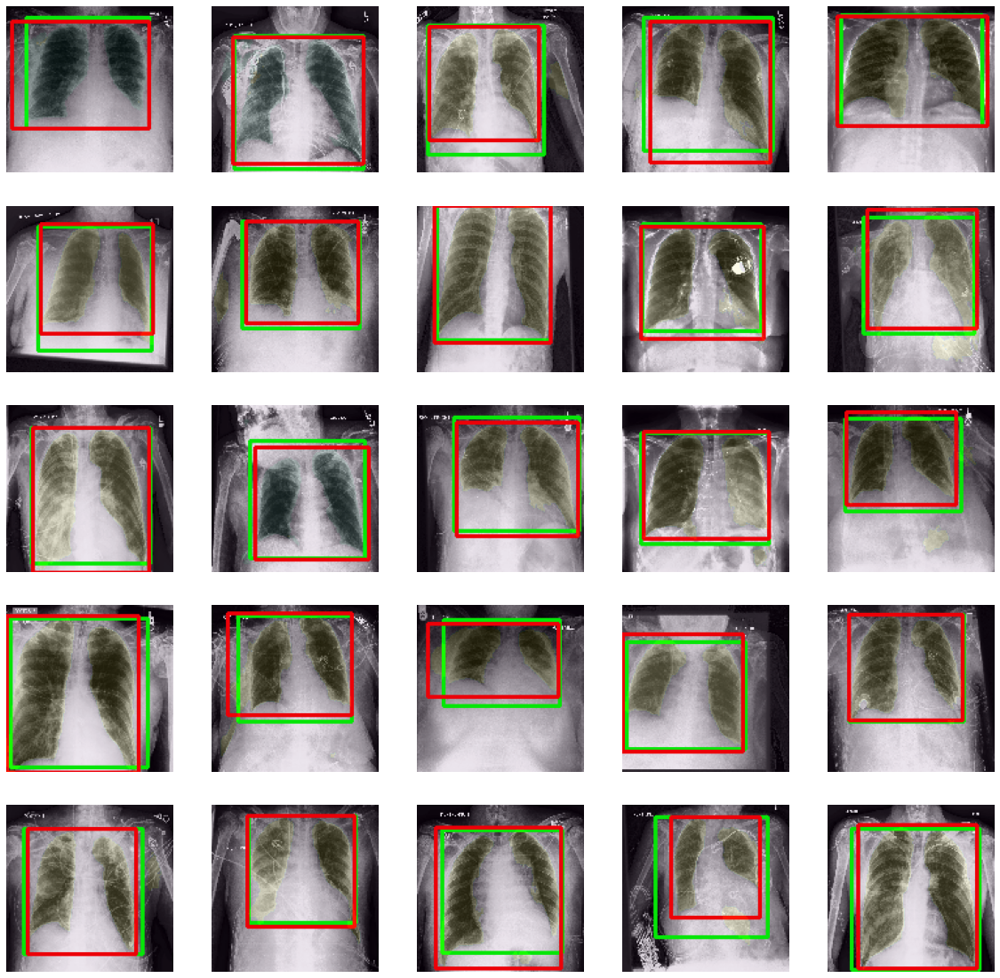

In [148]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

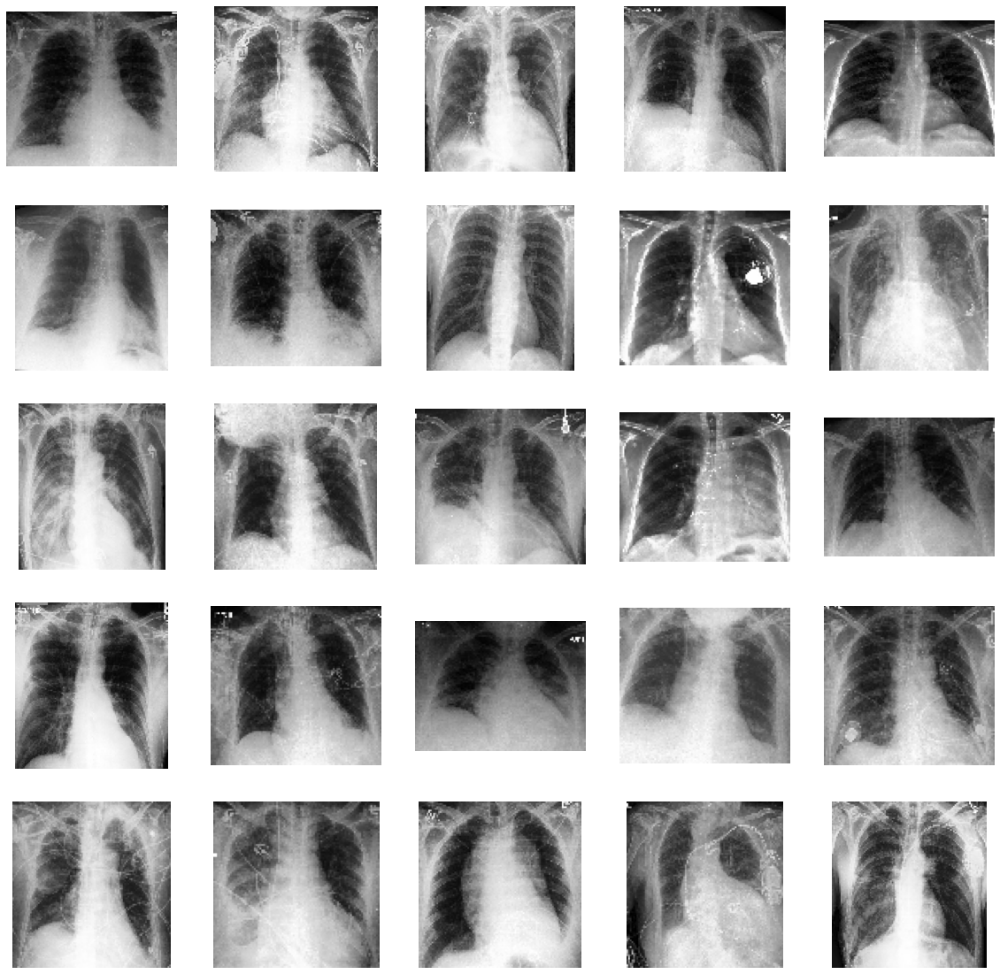

In [149]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

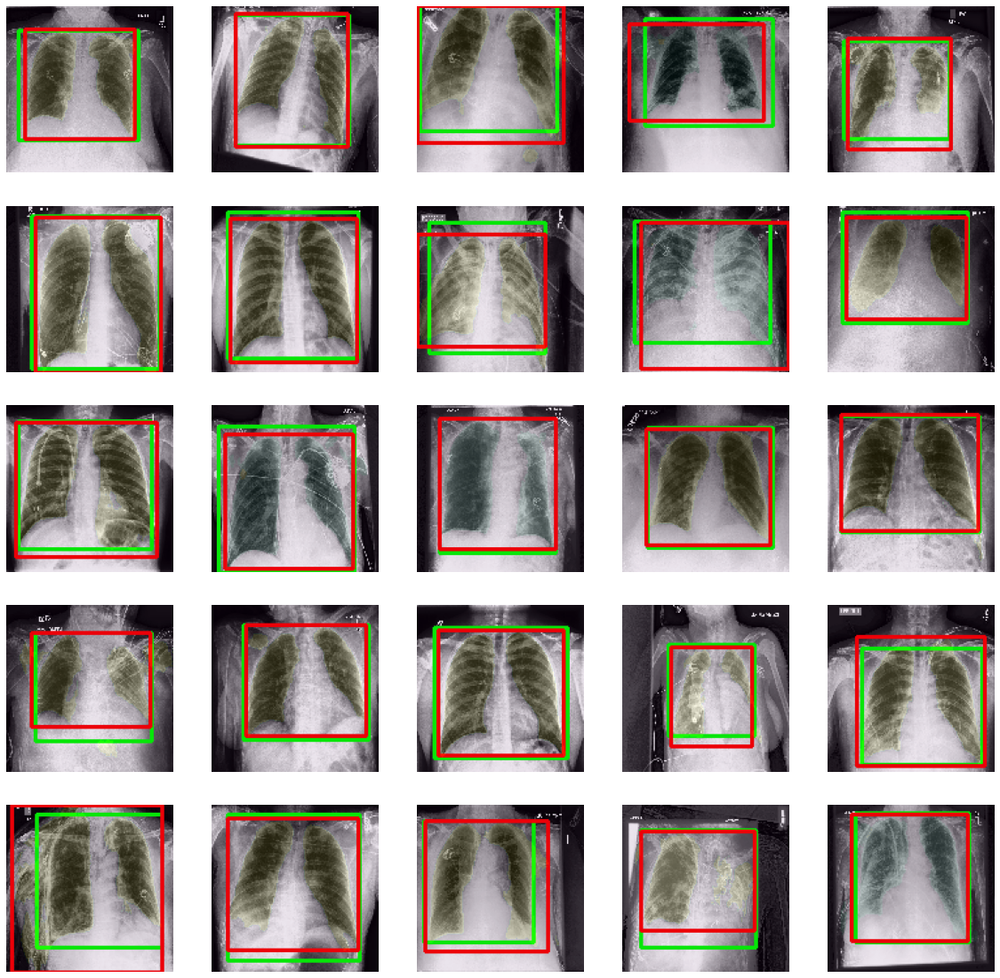

In [150]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = plot_files[count])
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(plot_x[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(img)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = plot_y[count], 
                                                 color = (255, 0, 0), thickness = 2))
    mask = bbox_utils().resize_image(image = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1]), 
                                     shape = (128, 128))
    axs[i, j].imshow(mask, alpha = 0.1)
    axs[i, j].axis('off')
    count += 1

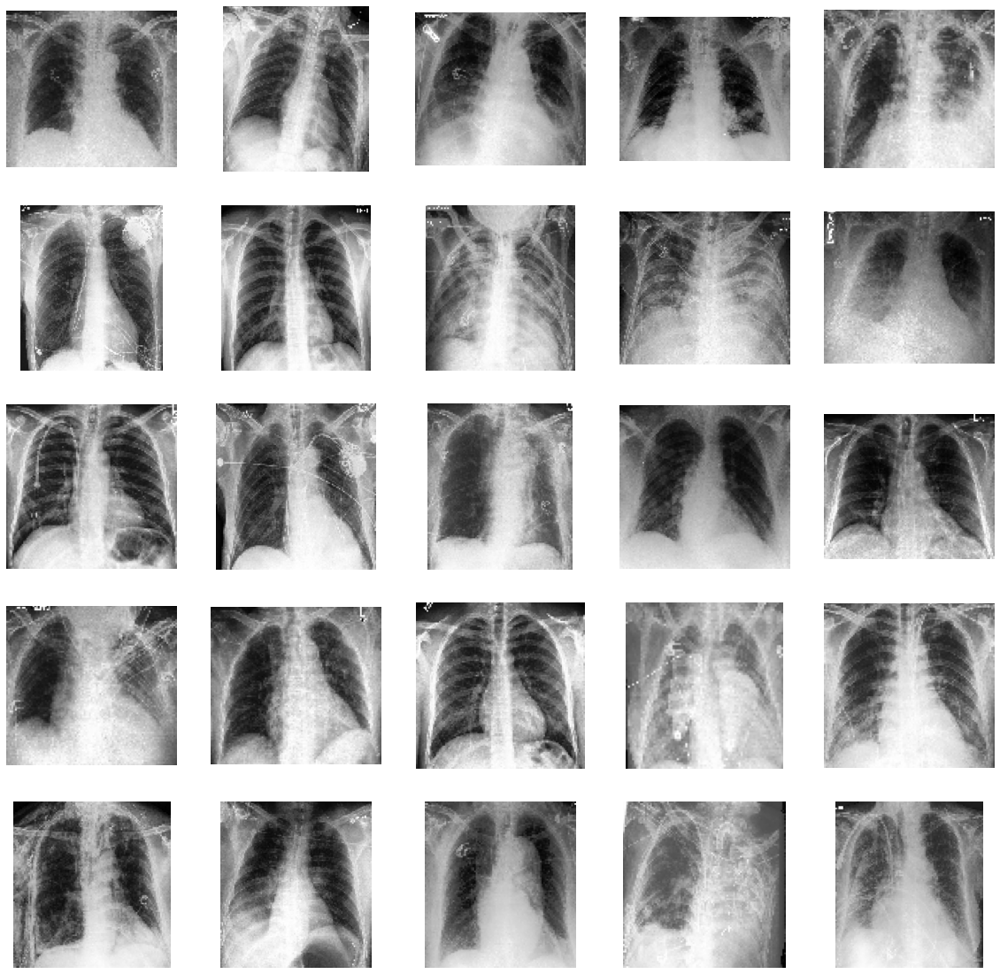

In [151]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 25
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(plot_x[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = plot_x[count], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 10. Testing in another database
***

In [ ]:
!cp -r /content/gdrive/MyDrive/montglomery-shenzhen-datasets.zip /content/
!unzip /content/montglomery-shenzhen-datasets.zip
!rm /content/montglomery-shenzhen-datasets.zip

In [67]:
filelist_montgomery = glob.glob('/content/Montgomery/MontgomerySet/CXR_png/*.png')
filelist_shenzen = glob.glob('/content/ChinaSet_AllFiles/ChinaSet_AllFiles/CXR_png/*.png')

print('Number of Images from Montgomery Dataset:', len(filelist_montgomery), 'imagens')
print('Number of Images from Shenzhen Dataset:', len(filelist_shenzen), 'imagens')

montgomery_df = pd.DataFrame(filelist_montgomery, columns = ['Path'])
montgomery_df['Labels'] = np.zeros((len(filelist_montgomery, )))
shenzen_df = pd.DataFrame(filelist_shenzen, columns = ['Path'])
shenzen_df['Labels'] = np.zeros((len(filelist_shenzen, )))

Number of Images from Montgomery Dataset: 138 imagens
Number of Images from Shenzhen Dataset: 662 imagens


In [68]:
montgomery_generator = data_gen.flow_from_dataframe(dataframe = montgomery_df, directory = '', x_col = 'Path',
                                                    y_col = ['Labels'], target_size = (128, 128), 
                                                    color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                    shuffle = False, seed = 42)

shenzen_generator = data_gen.flow_from_dataframe(dataframe = shenzen_df, directory = '', x_col = 'Path',
                                                 y_col = ['Labels'], target_size = (128, 128), 
                                                 color_mode = 'rgb', batch_size = 64, class_mode = 'raw', 
                                                 shuffle = False, seed = 42)

for i in range(0, len(montgomery_generator)):
  x, y = montgomery_generator[i]
  if i == 0:
    images_mont, labels_mont = x, y
  else:
    images_mont, labels_mont = np.concatenate((images_mont, x)), np.concatenate((labels_mont, y))

for i in range(0, len(shenzen_generator)):
  x, y = shenzen_generator[i]
  if i == 0:
    images_shen, labels_shen = x, y
  else:
    images_shen, labels_shen = np.concatenate((images_shen, x)), np.concatenate((labels_shen, y))

Found 138 validated image filenames.
Found 662 validated image filenames.


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

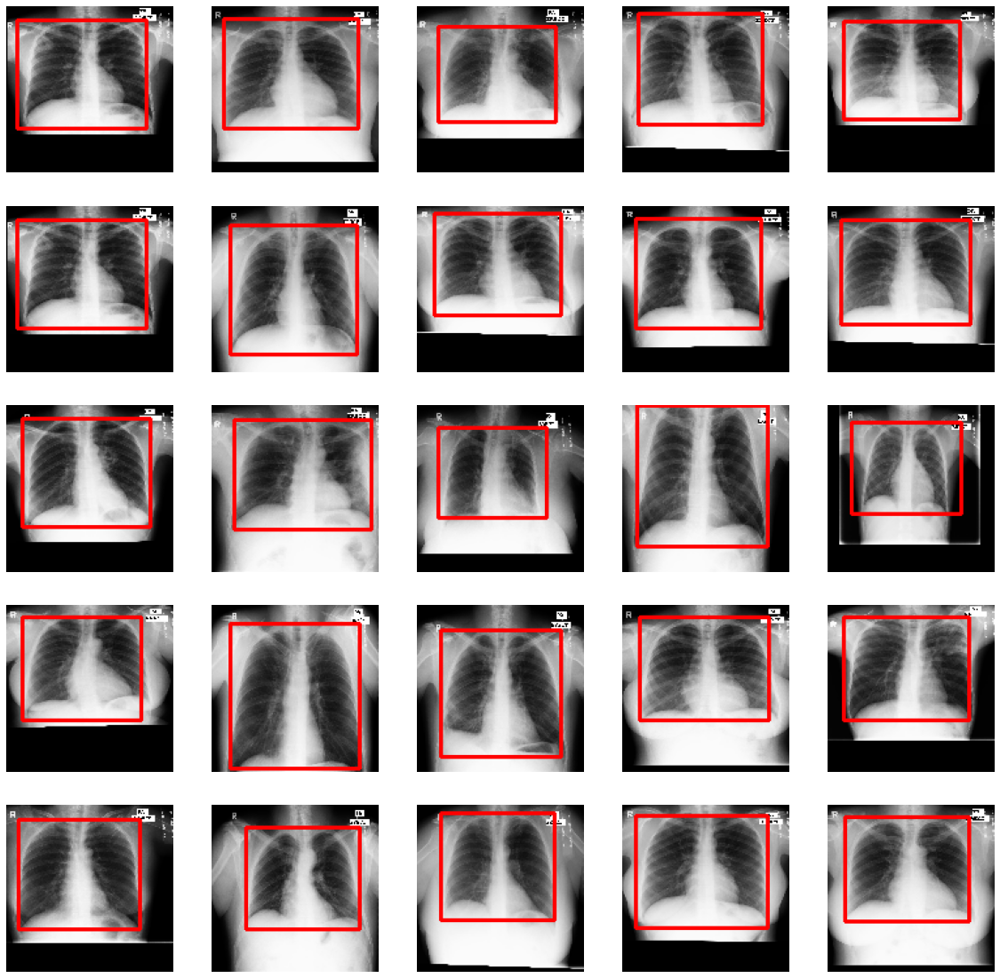

In [152]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

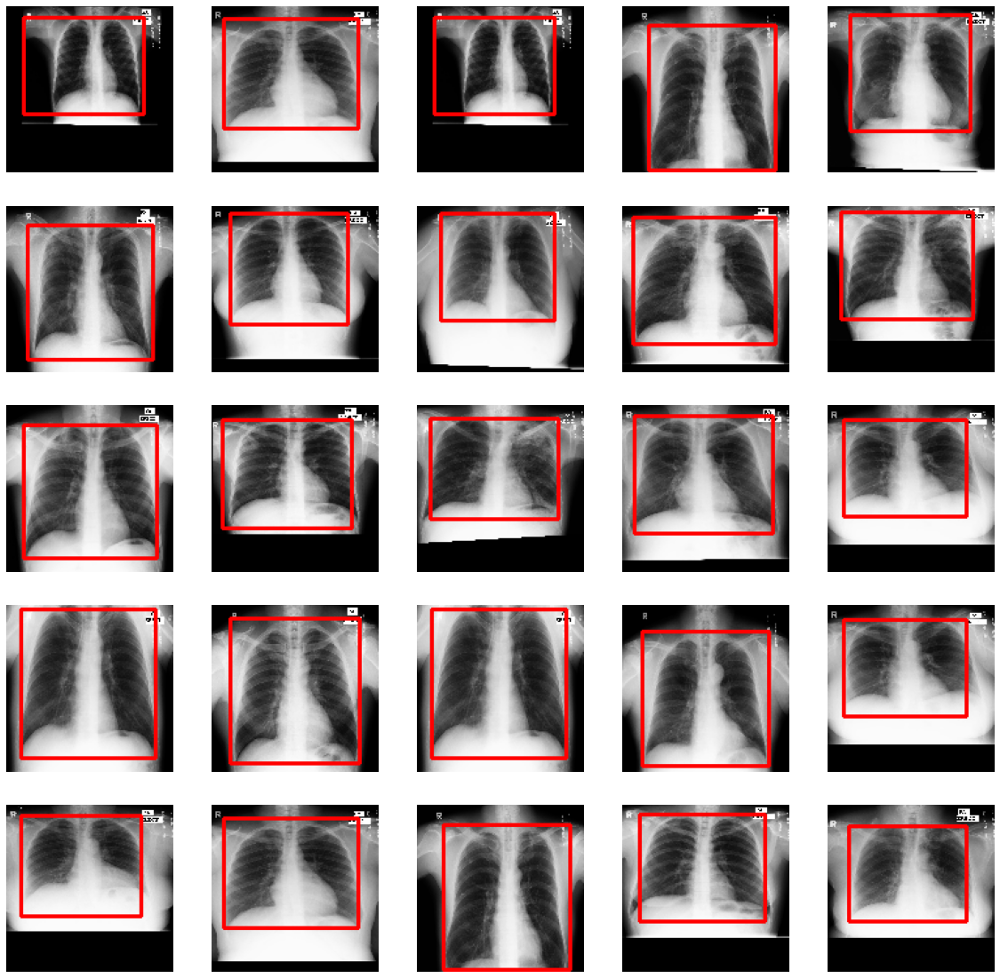

In [154]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_mont))
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_mont[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

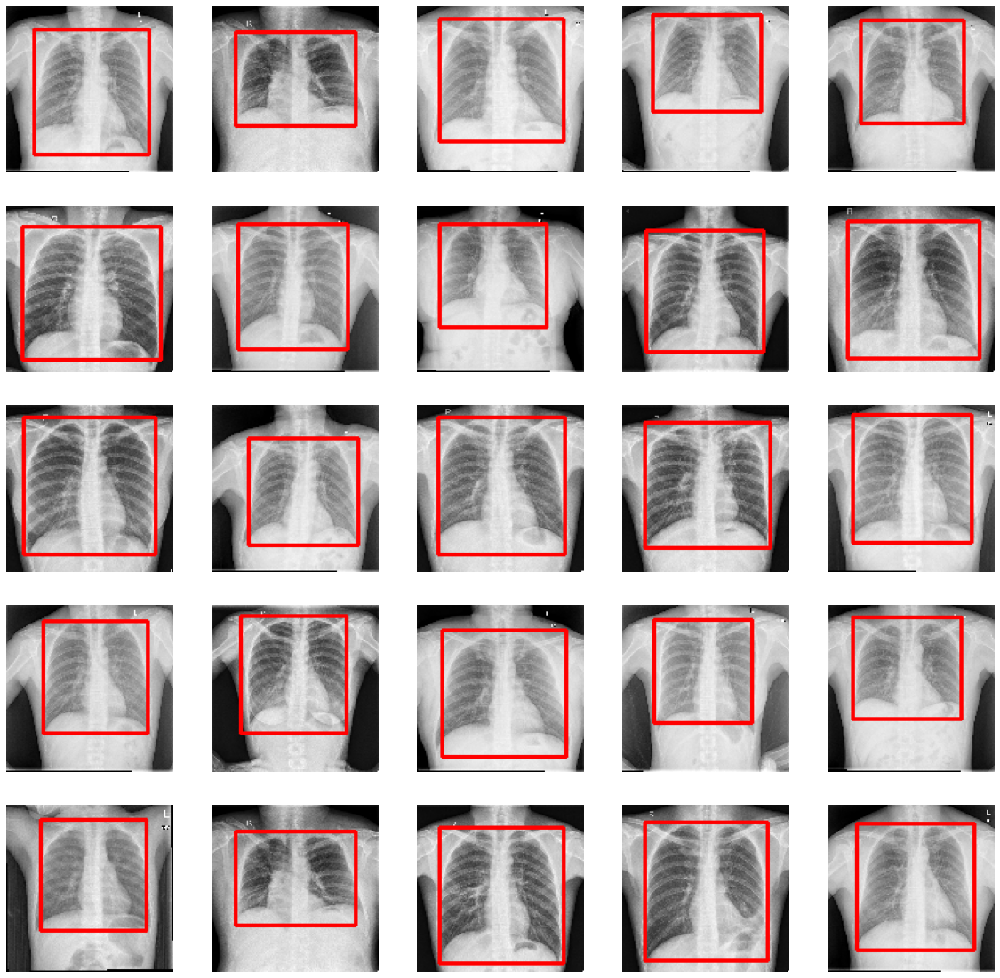

In [155]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

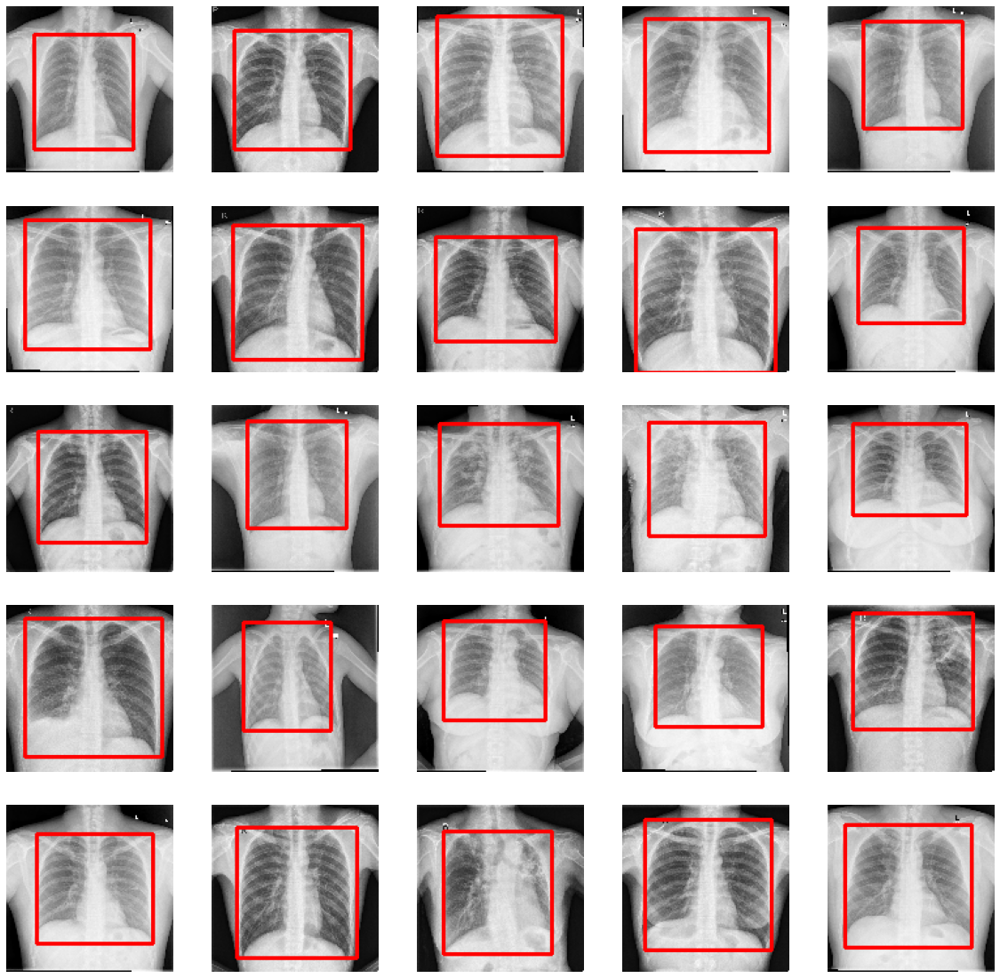

In [156]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(images_shen))
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = images_shen[count], list_coordinates = coordinates))
    axs[i, j].axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

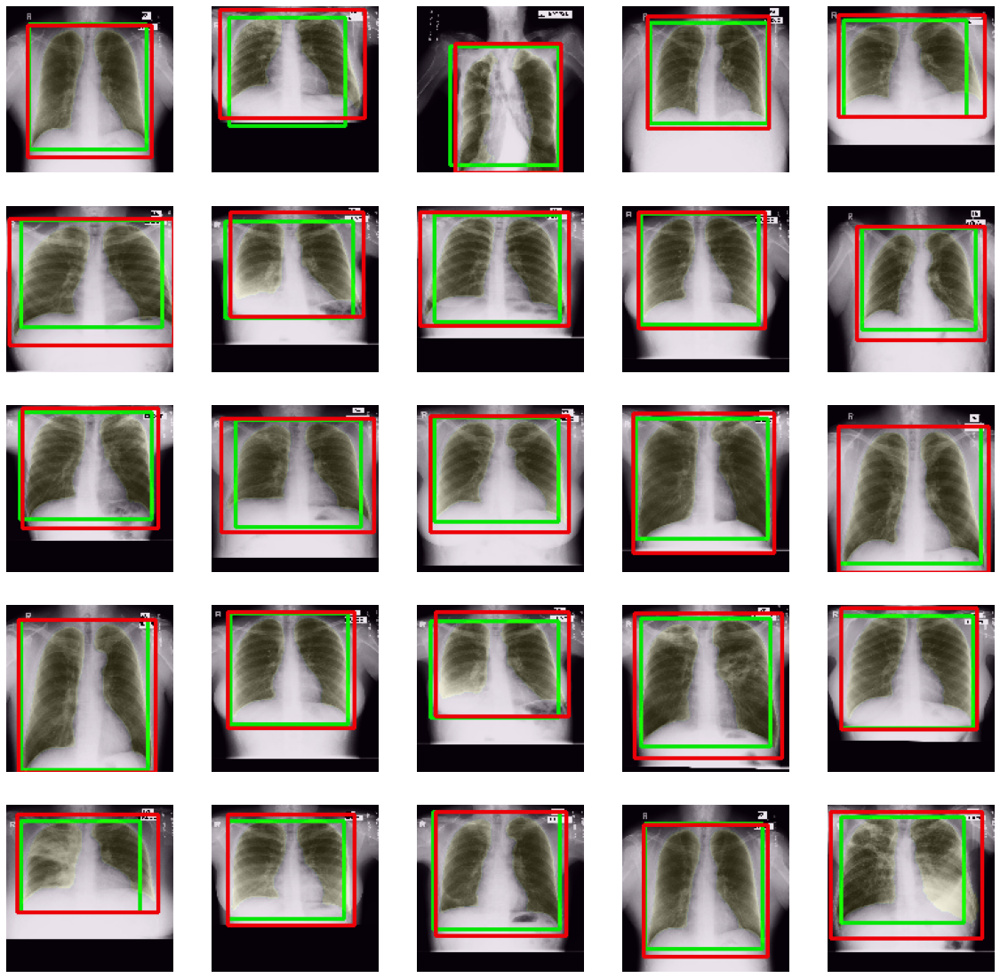

In [159]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_montgomery))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_montgomery[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_mont[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_mont[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

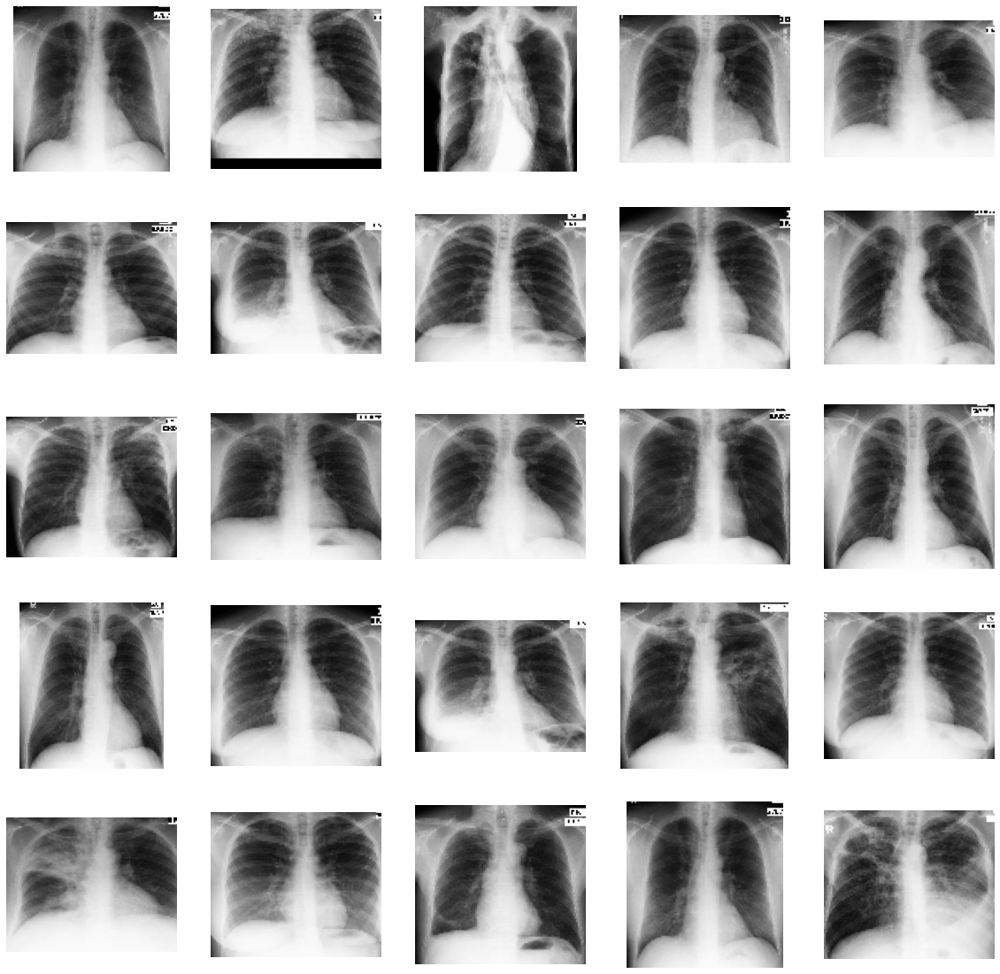

In [160]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_mont[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_mont[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

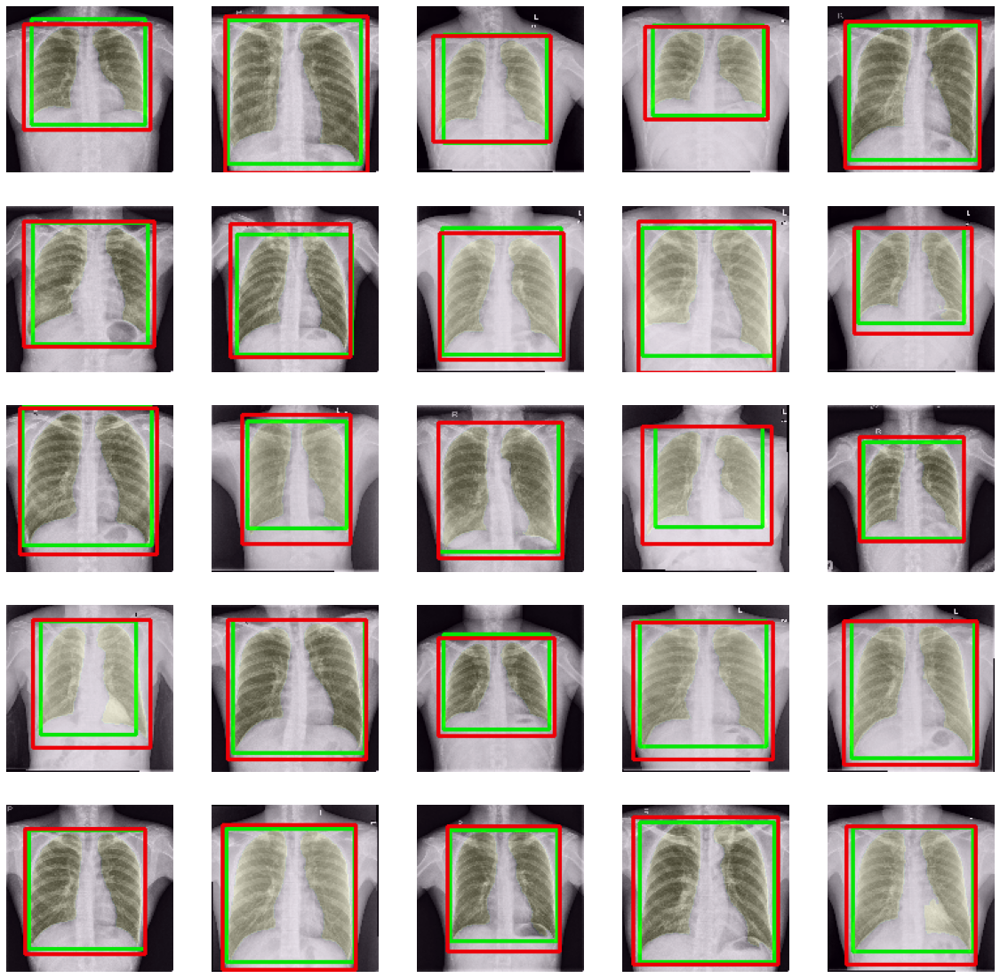

In [161]:
mem_count = list()
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
for i in range(0, 5):
  for j in range(0, 5):
    count = random.randrange(0, len(filelist_shenzen))
    img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = filelist_shenzen[count])
    original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
    contours = bbox_utils().get_contours(mask = original_mask.copy())
    mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours = contours), 
                                               image_shape = img.shape)
    list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
    coordinates = model.predict(np.reshape(images_shen[count], (1, 128, 128, 3)))[0]
    img = bbox_utils().draw_rectangle(images_shen[count], coordinates, color = (0, 255, 0), thickness = 2)
    axs[i, j].imshow(bbox_utils().draw_rectangle(image = img, list_coordinates = list_coordinates, 
                                                 color = (255, 0, 0), thickness = 2))
    original_mask = bbox_utils().resize_image(image = original_mask, shape = (128, 128))
    axs[i, j].imshow(original_mask, alpha = 0.1)
    axs[i, j].axis('off')
    mem_count.append(count)

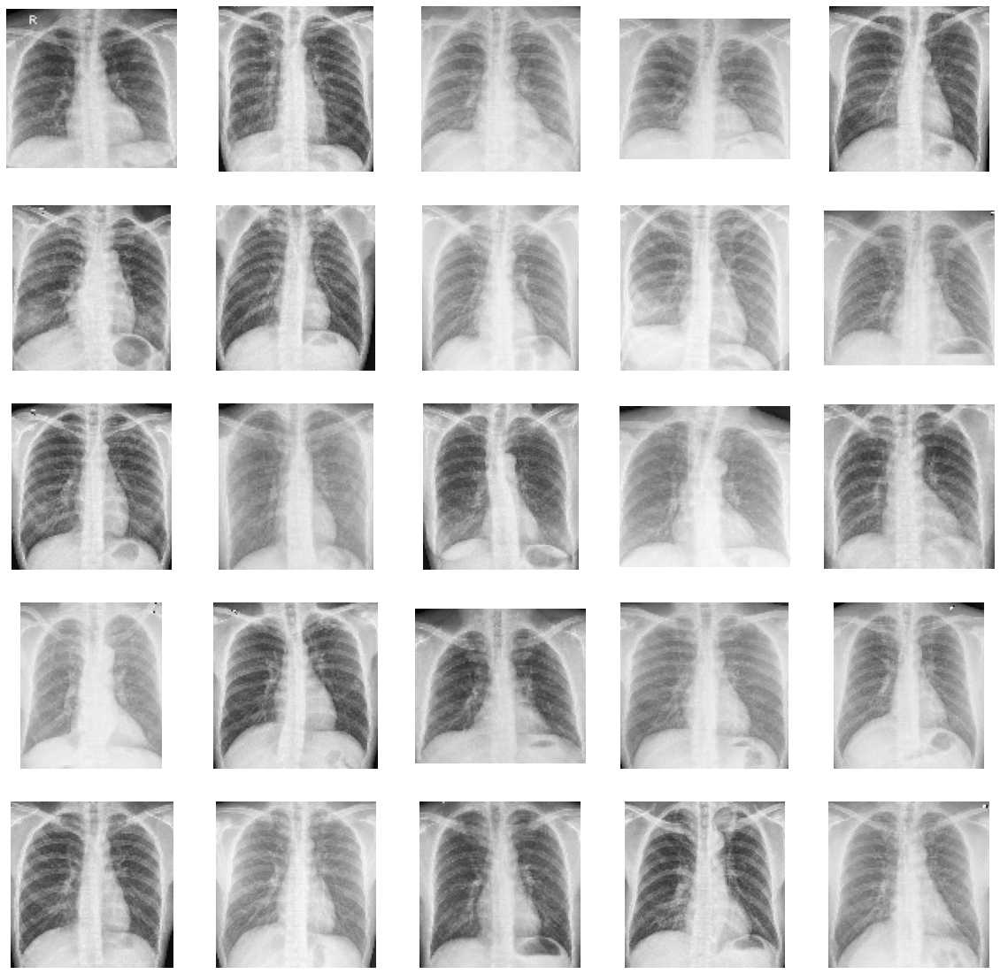

In [162]:
fig, axs = plt.subplots(nrows = 5, ncols = 5, figsize = (20, 20))
count = 0
for i in range(0, 5):
  for j in range(0, 5):
    coordinates = model.predict(np.reshape(images_shen[mem_count[count]], (1, 128, 128, 3)))[0]
    img = bbox_utils().crop_image(image = images_shen[mem_count[count]], list_coordinates = coordinates)
    axs[i, j].imshow(img)
    axs[i, j].axis('off')
    count += 1

## 11. Comparação de Tempo de Inferência
***

In [163]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  list_coordinates = bbox_utils().extract_coordinates(mask = original_mask)
  coordinates_list.append(list_coordinates)
end_time = time.time()

print('Pulmonary Segmentation')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation
Runtime: 29.457 milliseconds


In [164]:
start_time = time.time()
coordinates_list = list()
for image in plot_files:
  img, mask = bbox_utils().make_segmentation(model = seg_model, path_image = image)
  original_mask = bbox_utils().join_masks(lung_left = mask[0], lung_right = mask[1])
  contours = bbox_utils().get_contours(mask = original_mask.copy())
  mask_contours = bbox_utils().draw_contours(contours = bbox_utils().find_two_best_areas(contours =contours), 
                                             image_shape = img.shape)
  list_coordinates = bbox_utils().extract_coordinates(mask = mask_contours)
  coordinates_list.append(list_coordinates)

end_time = time.time()

print('Pulmonary Segmentation + Image Processing')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Pulmonary Segmentation + Image Processing
Runtime: 48.832 milliseconds


In [165]:
start_time = time.time()
for image in plot_files:
  coordinates_list  = model.predict(plot_x)
end_time = time.time()

print('Convolutional Neural Networks')
print('Runtime: {:.3f} milliseconds'.format(((end_time - start_time) / 50) * 1000))

Convolutional Neural Networks
Runtime: 1.671 milliseconds


|**Method**|**Inference Time (milliseconds)**|
|:-|:-:|
|Pulmonary Segmentation|29.457|
|Pulmonary Segmentation + Image Processing|48.832|
|Convolutional Neural Networks|1.671|